# Primary Identification and Vertex Reconstruction

In this notebook, we will demonstrate how to select primaries from interactions, and how to reconstruct the interaction vertex from `Particle` and `Interaction` objects.

In [1]:
# Basic boilerplate imports
import numpy as np
import pandas as pd
import yaml, os, sys, re

# Visualization Tools
import plotly
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import matplotlib.pyplot as plt
import seaborn as sns

import seaborn as sns
sns.set(rc={
    'figure.figsize':(20, 10), 
})
sns.set_context('talk') # or paper

In [2]:
pwd

'/sdf/home/k/koh0207/workshop/icarus_ml_workshop_2023/reconstruction/primary_and_vertex'

In [3]:
SOFTWARE_DIR = '/sdf/group/neutrino/koh0207/lartpc_mlreco3d' # Change this path to your software install
DATA_DIR = '/sdf/data/neutrino/icarus/workshop2023/' # Change this path if you are not on SDF (see main README)
# DATA_DIR = '/sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_1.h5'

# Set software directory
sys.path.append(SOFTWARE_DIR)

In [4]:
# Load anatools config file
# Replace the source file with the correct path
DATA_PATH = DATA_DIR + 'reco/mpvmpr_mini_reco.h5'
# DATA_PATH = DATA_DIR
anaconfig = './primary_and_vertex.cfg' # Inside the main directory
anaconfig = yaml.safe_load(open(anaconfig, 'r').read().replace('DATA_PATH', DATA_PATH))

In [5]:
# Initialize Anatools manager
from analysis.manager import AnaToolsManager

manager = AnaToolsManager(anaconfig)
manager.initialize()

Welcome to JupyROOT 6.22/08
Registered /sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_0.h5
Registered /sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_1.h5
Registered /sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_2.h5
Registered /sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_3.h5
Registered /sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_4.h5
Registered /sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_5.h5
Registered /sdf/data/neutrino/icarus/mpvmpr/test/mlreco_07072023/mpvmpr_chain_output_processsed_072023_6.h5


In [6]:
# Forward a single image-worth of data (when running the full chain)
# data, result = manager.forward()

# Get entry number #ENTRY_NUM from HDF5 (when reading from HDF5)
ENTRY_NUM = 1
data, result = manager.forward(iteration=ENTRY_NUM)

In [7]:
# manager.build_representations(data, result, mode='all')
manager.load_representations(data, result, mode='all')
manager.convert_pixels_to_cm(data, result)

Converting units from px to cm...


In [8]:
# Retrieving data structures
particles          = result['particles'][0]
truth_particles    = result['truth_particles'][0]
interactions       = result['interactions'][0]
truth_interactions = result['truth_interactions'][0]

First, we list the necessary post-processing modules required for primary and vertex reconstruction:
 * `assign_particle_extrema`: Post-processor for assigning track startpoint and endpoint, with added correction modules. Recall that the predictions from the ml network for particle start and end points are not ordered. For the default setting `mode='local_density'`, it will compute the local energy deposition density at each of the extrema and set the point with the larger local energy density as the endpoint. 
   * Example:
        ```yaml
          assign_particle_extrema:
            priority: 2
            profile: True
            mode: local_density
        ```
 * `adjust_pid_and_primary_labels`: Post-processor for adjusting PID and primary predictions, using softmax scores. Recall that (as of now, 07/11/2023), the primary and PID predictions are obtained by thresholding on a optimized softmax score value rather than by taking the argmax.
   * Example
        ```yaml
          adjust_pid_and_primary_labels:
            priority: 2
            primary_threshold: 0.2
        ```
 * `reconstruct_directions`: Post-processor for computing particle direction. 
   * Example:
        ```yaml
          reconstruct_directions:
            priority: 1
            neighborhood_radius: 5
            optimize: True
        ```
 * `reconstruct_vertex`: Non-ML algorithm for reconstructing the interaction vertex.
   * Example:
        ```yaml
          reconstruct_vertex:
            include_semantics: [0,1]
            use_primaries: True
            r1: 5.0
            r2: 10.0
        ```

In [9]:
manager.run_post_processing(data, result, verbose=True)

Registered post-processor assign_particle_extrema
Registered post-processor adjust_pid_and_primary_labels
Registered post-processor reconstruct_directions
Registered post-processor match_particles
Registered post-processor match_interactions
Registered post-processor reconstruct_vertex


## 2. Visualizing Primary Predictions

Let us first plot the event displays for both predicted and true primary labels.

In [10]:
from analysis.post_processing.evaluation.match import generate_match_pairs

In [11]:
matches = generate_match_pairs(truth_interactions, interactions)
matches = matches['matches_t2r']

In [12]:
from mlreco.visualization.plotly_layouts import plotly_layout3d
from mlreco.visualization.points import get_event_displays

In [13]:
# Example traces (3d scatterplots)
# Feel free to change the `color` or `mode` attribute to visualize different particle attributes. 
traces_reco = get_event_displays(particles, color='is_primary', size=1, mode='points', colorscale='Blues')
traces_true = get_event_displays(truth_particles, color='is_primary', size=1, mode='points', colorscale='Blues')

In [14]:
matches

[(TruthInteraction(id=0  , vertex=[-266.64   -74.91   184.599], nu_id=1, size=5047, Topology=2pi4p),
  Interaction(id=1  , vertex=[-266.34   -75.31   184.199], nu_id=-1, size=5029, Topology=1pi5p)),
 (TruthInteraction(id=1  , vertex=[-335.34   108.09  -686.601], nu_id=0, size=2984, Topology=1mu),
  Interaction(id=4  , vertex=[-1. -1. -1.], nu_id=-1, size=2983, Topology=1mu)),
 (TruthInteraction(id=2  , vertex=[-125.34    72.39   379.299], nu_id=0, size=780 , Topology=1mu),
  Interaction(id=15 , vertex=[-1. -1. -1.], nu_id=-1, size=780 , Topology=1mu)),
 (TruthInteraction(id=3  , vertex=[-162.24    45.39    80.499], nu_id=0, size=3148, Topology=1mu),
  Interaction(id=2  , vertex=[-1. -1. -1.], nu_id=-1, size=3148, Topology=1mu)),
 (TruthInteraction(id=5  , vertex=[-279.54  -129.51   261.399], nu_id=0, size=4966, Topology=1mu),
  Interaction(id=10 , vertex=[-1. -1. -1.], nu_id=-1, size=4957, Topology=1mu))]

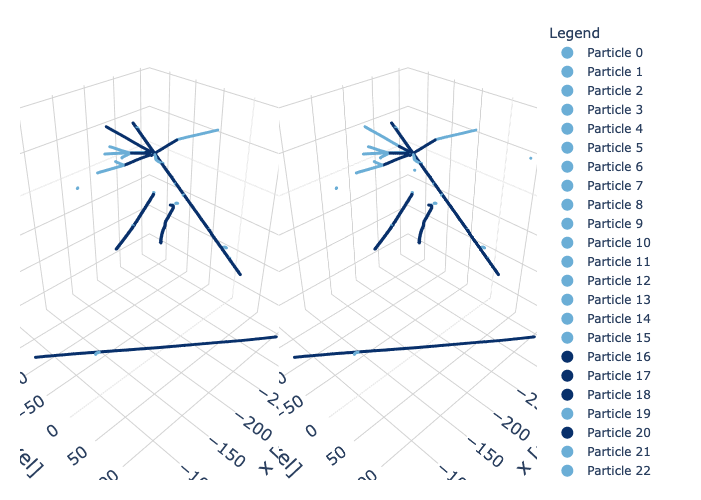

In [15]:
# Template cell for side-by-side event displays
make_plots = True
if make_plots:
    fig = make_subplots(rows=1, cols=2,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                        horizontal_spacing=0.05, vertical_spacing=0.04)

    fig.add_traces(traces_reco, rows=len(traces_reco) * [1], cols=len(traces_reco) * [1])
    fig.add_traces(traces_true, rows=len(traces_true) * [1], cols=len(traces_true) * [2])

    fig.layout = plotly_layout3d()
    fig.update_layout(showlegend=True,
                      legend=dict(xanchor="left"),
                     autosize=True,
                     height=500,
                     width=1000,
                     margin=dict(r=20, l=20, b=20, t=20))
    iplot(fig)

### 2-1. Visualizing **`Interaction/TruthInteraction`** Vertices

In [16]:
# Example traces (3d scatterplots)
# Feel free to change the `color` or `mode` attribute to visualize different particle attributes. 
traces_reco = get_event_displays(interactions, 
                                 color='depositions', size=1, 
                                 mode='points', colorscale='jet', 
                                 scatter_vertices=True, 
                                 cmax=200)
traces_true = get_event_displays(truth_interactions, 
                                 color='depositions', size=1, 
                                 mode='points', colorscale='jet', 
                                 scatter_vertices=True, 
                                 cmax=200)

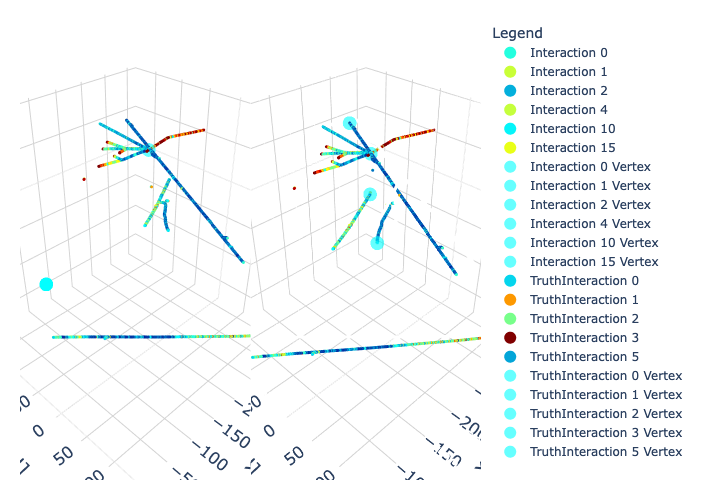

In [17]:
# Template cell for side-by-side event displays
make_plots = True
if make_plots:
    fig = make_subplots(rows=1, cols=2,
                        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                        horizontal_spacing=0.05, vertical_spacing=0.04)

    fig.add_traces(traces_reco, rows=len(traces_reco) * [1], cols=len(traces_reco) * [1])
    fig.add_traces(traces_true, rows=len(traces_true) * [1], cols=len(traces_true) * [2])

    fig.layout = plotly_layout3d()
    fig.update_layout(showlegend=True,
                      legend=dict(xanchor="left"),
                     autosize=True,
                     height=500,
                     width=1000,
                     margin=dict(r=20, l=20, b=20, t=20))
    iplot(fig)

## 3. Vertex Reconstruction Algorithm

The current non-ML vertex reconstruction algorithm is a combination of three different approaches to locating the interaction vertex. 

To find the interaction vertex, we search for "candidate vertices" that satisfy one of the following definitions. 
> **Note**:
> We only use primary particles when locating the interaction vertex. However this restriction may be lifted with a change in config. 

 * When two startpoints $p_1, p_2$ are adjacent within some radius $r_1$, we take $v = \frac{p_1 + p_2}{2}$ as a vertex candidate. 
 * If a track startpoint $p_1$ and a shower direction vector $\vec{v}_1$ has distance of closest appraoch less than some radius $r_2$, we take the $p_1$ as a vertex candidate. 
 * If 1) and 2) both fail, and there are more than two primary particles in a given interaction, we compute the *pseudovertex* of an interaction. The *pseudovertex* is a point of closest approach for $N$ lines in 3D space defined by the startpoint and starting direction of each particle. 
 
> **Exercise**
> Suppose we have $N$ lines defined by a point $p_i \in \mathbb{R}^3$ and unit vector $\vec{v}_i \in \mathbb{R}^3$ in $\mathbb{R}^3$. Solve for $p_0$, the point of closest approach of $N$ lines. 

In [18]:
from scipy.spatial.distance import cdist
from analysis.post_processing.reconstruction.vertex import point_to_line_distance

In [19]:
def get_adjacent_startpoint_candidate(particles,
                                      r1=5.0):
    candidates = []
    startpoints = []
    for p in particles:
        startpoints.append(p.start_point)
    if len(startpoints) == 0:
        return np.array(candidates)
    startpoints = np.vstack(startpoints)
    dist = cdist(startpoints, startpoints)
    dist += -np.eye(dist.shape[0])
    idx, idy = np.where((dist < r1) & (dist > 0))
    
    # Keep track of duplicate pairs
    duplicates = []
    # Append barycenter of two touching points within radius r1 to candidates
    for ix, iy in zip(idx, idy):
        center = (startpoints[ix] + startpoints[iy]) / 2.0
        if not((ix, iy) in duplicates or (iy, ix) in duplicates):
            candidates.append(center)
            duplicates.append((ix, iy))
            
    candidates = np.array(candidates)
    return candidates

In [20]:
def get_track_shower_candidate(particles,
                               r2=5.0):

    candidates, track_starts = [], []
    shower_starts, shower_dirs = [], []
    
    for p in particles:
        if p.semantic_type == 0 and len(p.points) > 0:
            shower_starts.append(p.start_point)
            shower_dirs.append(p.start_dir)
        if p.semantic_type == 1:
            track_starts.append(p.start_point)
            
    if len(shower_starts) == 0 or len(track_starts) == 0:
        return np.array(candidates)
    
    shower_dirs = np.vstack(shower_dirs)
    shower_starts = np.vstack(shower_starts)
    track_starts = np.vstack(track_starts)
    
    dist = point_to_line_distance(track_starts, shower_starts, shower_dirs)
    idx, idy = np.where(dist < r2)
    for ix, iy in zip(idx, idy):
        candidates.append(track_starts[ix])
        
    candidates = np.array(candidates)
    return candidates

In [21]:
def get_pseudovertex_candidate(particles, dim=3):
    
    if len(particles) < 2:
        return np.array([])
    
    pseudovtx = np.zeros((dim, ))
    S = np.zeros((dim, dim))
    C = np.zeros((dim, ))

    assert len(particles) >= 2
        
    for p in particles:
        startpt = p.start_point
        vec = p.start_dir
        w = 1.0
        S += w * (np.outer(vec, vec) - np.eye(dim))
        C += w * (np.outer(vec, vec) - np.eye(dim)) @ startpt

    pseudovtx = np.linalg.pinv(S) @ C
    return pseudovtx

In [22]:
def reconstruct_vertex_fn(particles, r1=5.0, r2=10.0):
    
    vertex = None
    
    candidates = []
    cand_1 = get_adjacent_startpoint_candidate(particles, r1)
    cand_2 = get_track_shower_candidate(particles, r2=r2)
    
    if len(cand_1) > 0:
        candidates.append(cand_1)
    if len(cand_2) > 0:
        candidates.append(cand_2)
    if len(candidates) == 0:
        cand_3 = get_pseudovertex_candidate(particles, dim=3)
        if len(cand_3) > 0: candidates.append(cand_3)
        
    if len(candidates) > 0:
        candidates = np.vstack(candidates)
        vertex = np.mean(candidates, axis=0)
        
    return vertex

In [23]:
true_ia = truth_interactions[0]
reco_ia = interactions[1]

In [24]:
reco_ia_particles = [p for p in reco_ia.particles if p.is_primary]

vtx_1 = get_adjacent_startpoint_candidate(reco_ia_particles)
vtx_2 = get_track_shower_candidate(reco_ia_particles)
vtx_3 = get_pseudovertex_candidate(reco_ia_particles)

vertices = np.vstack([vtx_1, vtx_3])

In [25]:
traces_true = get_event_displays([true_ia], 
                                 color='depositions', size=1, 
                                 mode='points', colorscale='jet', 
                                 scatter_vertices=True, 
                                 cmax=200)

traces_vertex = [go.Scatter3d(x=vtx_1[:, 0],
                    y=vtx_1[:,1],
                    z=vtx_1[:,2],
                    mode='markers',
                    marker=dict(
                        size=5,
                        color='red',
                        # colorscale=colorscale,
                        opacity=0.6),
                        # hovertext=p.ppn_candidates[:, 4],
                    name='Method 1'),
                go.Scatter3d(x=vtx_3[None, 0],
                    y=vtx_3[None, 1],
                    z=vtx_3[None, 2],
                    mode='markers',
                    marker=dict(
                        size=5,
                        color='blue',
                        # colorscale=colorscale,
                        opacity=0.6),
                        # hovertext=p.ppn_candidates[:, 4],
                    name='PseudoVertex')]

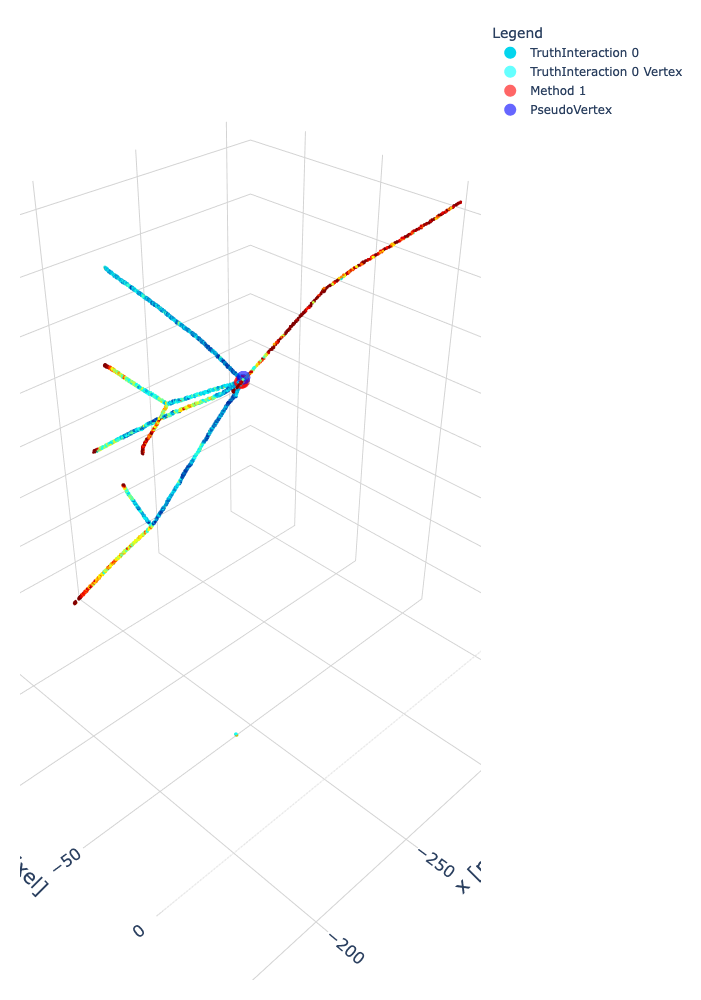

In [26]:
# Template cell for side-by-side event displays
make_plots = True
if make_plots:
    fig = make_subplots(rows=1, cols=1,
                        specs=[[{'type': 'scatter3d'}]],
                        horizontal_spacing=0.05, vertical_spacing=0.04)

    # fig.add_traces(traces_reco, rows=len(traces_reco) * [1], cols=len(traces_reco) * [1])
    fig.add_traces(traces_true, rows=len(traces_true) * [1], cols=len(traces_true) * [1])
    fig.add_traces(traces_vertex, rows=len(traces_vertex) * [1], cols=len(traces_vertex) * [1])

    fig.layout = plotly_layout3d()
    fig.update_layout(showlegend=True,
                      legend=dict(xanchor="left"),
                     autosize=True,
                     height=1000,
                     width=1000,
                     margin=dict(r=20, l=20, b=20, t=20))
    iplot(fig)

## 4. Performance Studies

In [27]:
from mlreco.visualization.metrics import *
from sklearn.metrics import confusion_matrix

In [ ]:
df_intrs = pd.read_csv('./interactions.csv')
df_parts = pd.read_csv('./particles.csv') 

In [ ]:
df_parts['reco_particle_id']

In [ ]:
df_plot = pd.DataFrame()
df_plot['Truth'] = df_parts.query('reco_particle_id != -1')['true_particle_is_primary'].astype(bool)
df_plot['Prediction'] = df_parts.query('reco_particle_id != -1')['reco_particle_is_primary'].astype(bool)
df_plot['match_value'] = df_parts.query('reco_particle_id != -1')['particle_match_counts']

In [ ]:
labels = sorted(set(list(df_plot['Truth'].unique()) + list(df_plot['Prediction'].unique())))
row_labels = sorted(set(list(df_plot['Truth'].unique())))
col_labels = sorted(set(list(df_plot['Prediction'].unique())))

In [ ]:
cm = confusion_matrix(df_plot['Truth'], df_plot['Prediction'], normalize='true')
cm_counts = confusion_matrix(df_plot['Truth'], df_plot['Prediction'])

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.grid(None)
im = heatmap(cm * 100, 
             row_labels, 
             col_labels, 
             ax=ax, cmap="Blues")
texts = annotate_heatmap(im, unc=cm_counts, valfmt="{:.2f}% \n ({:.0f})", fontsize=20)
ax.set_ylabel('True Particle Primary ID', fontsize=20)
ax.set_xlabel('Reco Particle Primary ID', fontsize=20)
ax.set_yticklabels(row_labels, fontsize=15, va='center', rotation=90)
ax.set_xticklabels(col_labels, fontsize=15, va='center', rotation =0)
ax.set_title('Primary ID Accuracy', y=1.1, fontsize=20)
ax.tick_params(axis='both', length=0, pad=15)
ax.grid(None)

In [ ]:
truth_without_matches = df_parts.query('reco_particle_id == -1').shape[0] / df_parts.shape[0]
print("{:.3f} % of true particles do not have a matching reco particle!".format(truth_without_matches * 100))

In [ ]:
df_intrs.columns

In [ ]:
vertices = df_intrs[['true_interaction_id', 'reco_interaction_id', 'true_nu_id', 
                     'reco_vertex_x', 'reco_vertex_y', 'reco_vertex_z',
                     'true_vertex_x', 'true_vertex_y', 'true_vertex_z']]

vertices['vertex_is_reconstructed'] = ~(df_intrs[['reco_vertex_x', 'reco_vertex_y', 'reco_vertex_z']].values == -1).all(axis=1)

In [ ]:
perc_all = vertices.query(
    'vertex_is_reconstructed').shape[0] / vertices.shape[0]

perc_nus = vertices.query(
    'true_nu_id == 1 and vertex_is_reconstructed').shape[0] / \
    vertices.query('true_nu_id == 1').shape[0]

match_perc = vertices.query(
    'reco_interaction_id != -1').shape[0] / \
    vertices.shape[0]

match_nu_perc = vertices.query(
    'true_nu_id == 1 and reco_interaction_id != -1').shape[0] / \
    vertices.query('true_nu_id == 1').shape[0]

print("{:.3f} % of vertices are reconstructed.".format(perc_all * 100))
print("{:.3f} % of nu-like vertices are reconstructed.".format(perc_nus * 100))
print("{:.3f} % of true interactions are matched.".format(match_perc * 100))
print("{:.3f} % of true nu-like interactions are matched.".format(match_nu_perc * 100))

In [ ]:
reco_vtxs = vertices.query(
    'true_nu_id == 1 and reco_interaction_id != -1')[['reco_vertex_x', 'reco_vertex_y', 'reco_vertex_z']].values
true_vtxs = vertices.query(
    'true_nu_id == 1 and reco_interaction_id != -1')[['true_vertex_x', 'true_vertex_y', 'true_vertex_z']].values

dvtx = reco_vtxs - true_vtxs
dists = np.linalg.norm(dvtx, axis=1)

In [ ]:
fig, ax = plt.subplots()
ax.hist(dists, bins=100, range=(0, 1000))
ax.set_yscale('log')
ax.set_xlabel('$\Delta x$', fontsize=30)

In [ ]:
print("{}% within {:.2f}cm".format(90, np.percentile(dists, q=90)))
print("{}% within {:.2f}cm".format(95, np.percentile(dists, q=95)))